# Micro-Credit Defaulter Analysis & creating Model

Importing all required library

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
#from scipy.stats import zscore
#from sklearn.preprocessing import LabelEncoder
#from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
#from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
#from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
#from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import power_transform
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import joblib
import warnings
warnings.filterwarnings("ignore")


Load the Data

In [2]:
#uploading dataset
ds=pd.read_csv("Data_file.csv")
ds

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,20/07/2016
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,10/08/2016
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,19/08/2016
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,06/06/2016
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,22/06/2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,...,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,UPW,17/06/2016
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,...,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,UPW,12/06/2016
209590,209591,1,28556I85350,1013.0,11843.111670,11904.350000,5861.83,8893.20,3.0,0.0,...,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,UPW,29/07/2016
209591,209592,1,59712I82733,1732.0,12488.228330,12574.370000,411.83,984.58,2.0,38.0,...,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,UPW,25/07/2016


Observations: Data set related to Telecom Industry (mobile rechage and micro loan)

In [81]:
#changing Dataset in Dataframe
ds=pd.DataFrame(data=ds)

In [4]:
dd=pd.read_csv('Data_Description.csv')
dd

,Variable,Definition,Comment
0,label,Flag indicating whether the user paid back the...,NaN
1,msisdn,mobile number of user,NaN
2,aon,age on cellular network in days,NaN
3,daily_decr30,"Daily amount spent from main account, averaged...",NaN
4,daily_decr90,"Daily amount spent from main account, averaged...",NaN
5,rental30,Average main account balance over last 30 days,Unsure of given definition
6,rental90,Average main account balance over last 90 days,Unsure of given definition
7,last_rech_date_ma,Number of days till last recharge of main account,NaN
8,last_rech_date_da,Number of days till last recharge of data account,NaN
9,last_rech_amt_ma,Amount of last recharge of main account (in In...,NaN


description of column of dataset

# Dataset basic details analysis (Null Value,data type, shape etc )

In [5]:
# top 5 rows of dataset
ds.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,20/07/2016
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,10/08/2016
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,19/08/2016
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,06/06/2016
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,22/06/2016


In [6]:
#name of column index
ds.keys()

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

there are 37 columns or parameters in the dataset where some are not providing much informations 

In [7]:
ds.label

0         0
1         1
2         1
3         1
4         1
         ..
209588    1
209589    1
209590    1
209591    1
209592    1
Name: label, Length: 209593, dtype: int64

indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}

In [8]:
ds.label.value_counts()

1    183431
0     26162
Name: label, dtype: int64

so as per dataset there are 183421 customers are non defaulters and 26162 are defaulter

In [9]:
ds.shape

(209593, 37)

there is 209593 rows and 37 cloumns available in original dataset

In [10]:
ds.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

there are objects, int and float values are present in data set.

In [11]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

Observations: 

#no null or missing values in data set.

Total number of columns having float value= 21 

Total number of columns having integer value= 13 

Total number of columns having object value (pdate <Date>, pcircle<telecom circle>, msisdn <which is mobile number> ) = 3

so we can drop obect columns also Unnamed is also not providing any information (working as index value) so we can drop it as well.

In [12]:
ds.isnull()
#reverifing the null value again

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
209589,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
209590,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
209591,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [13]:
ds.isnull().sum()
# total null value in dataset is 0

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

# Stastical analysis of dataset

In [14]:
ds.describe()

,Unnamed: 0,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,...,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,...,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,104797.000000,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.84780,3712.202921,2064.452797,...,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485
std,60504.431823,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.89223,53374.833430,2370.786034,...,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108
min,1.000000,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.00000,-29.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,52399.000000,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.00000,0.000000,770.000000,...,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000
50%,104797.000000,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.00000,0.000000,1539.000000,...,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667
75%,157195.000000,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.00000,0.000000,2309.000000,...,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000
max,209593.000000,1.000000,999860.755200,265926.000000,320630.000000,198926.110000,200148.110000,998650.37770,999171.809400,55000.000000,...,50.000000,306.000000,99864.560860,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000


Observation: all columns having same number of count 209593 ---> so no value is missing any of the columns
    
    there is object type columns available in dataset (pcircle, msisdn, pdate)
    

In [15]:
drop_cloumns=['Unnamed: 0','pcircle','msisdn','pdate']

for i in ds[drop_cloumns]:
    ds.drop(i, axis=1, inplace=True)

object value columns and Unnamed: 0 (which is working just like index and providing any further informations) droped from the dataset 

In [16]:
ds.shape

(209593, 33)

new datset (after droping object value columns and unnamed columns) having 33 columns now

In [17]:
ds.keys()

Index(['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90'],
      dtype='object')

In [18]:
ds.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,...,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,...,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.84780,3712.202921,2064.452797,3.978057,...,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.89223,53374.833430,2370.786034,4.256090,...,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.00000,-29.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.00000,0.000000,770.000000,1.000000,...,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.00000,0.000000,1539.000000,3.000000,...,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.00000,0.000000,2309.000000,5.000000,...,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000
max,1.000000,999860.755200,265926.000000,320630.000000,198926.110000,200148.110000,998650.37770,999171.809400,55000.000000,203.000000,...,50.000000,306.000000,99864.560860,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000


In [19]:
#check the unique value in dataset
ds.nunique()

label                        2
aon                       4507
daily_decr30            146328
daily_decr90            155483
rental30                131338
rental90                139036
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     23907
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     22694
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianamnt_loans90           6
payback30                 1363
payback9

<AxesSubplot:>

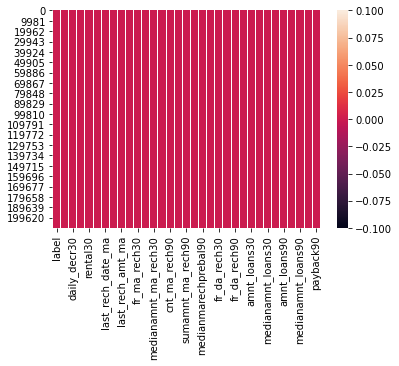

In [20]:
#once again checking null value through heat map
sns.heatmap(ds.isnull())


Observations: no null values are present

# Identifing the target & Independent features
As per the request "Build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter." 

Label is target variable and remain are independent

<AxesSubplot:xlabel='label', ylabel='count'>

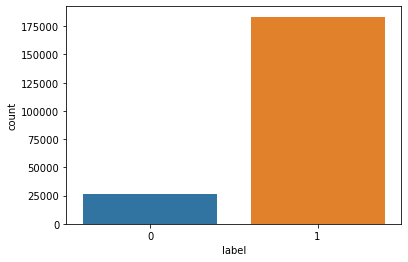

In [21]:
#By using count plot we can see the graph of defaulter and non defaulter
sns.countplot(x=ds["label"])

0---> defaulter 
1---> non defaulters

we can see ration of defaulter is very less than non defaulter (class imbalance problem)
so for the better model we have to resolve load balance probelem (we can use here oversampling in minority class)

In [22]:
ds.columns

Index(['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90'],
      dtype='object')

# EDA 

# EDA using Data Visualisations

Univariate Analysis

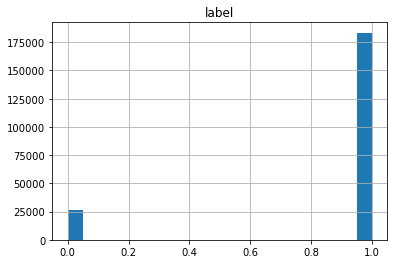

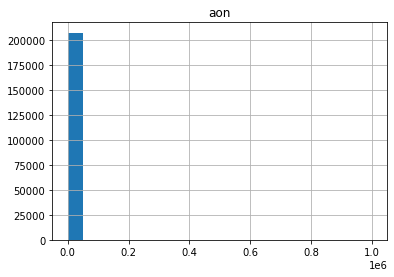

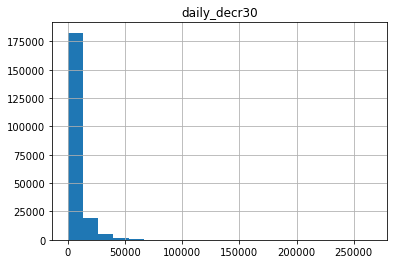

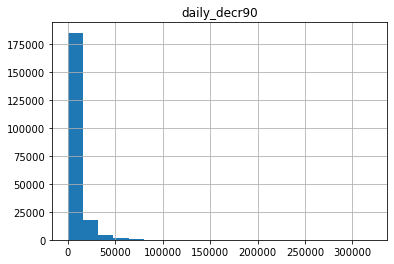

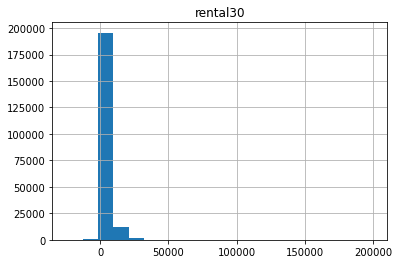

...

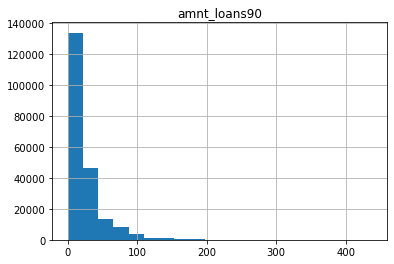

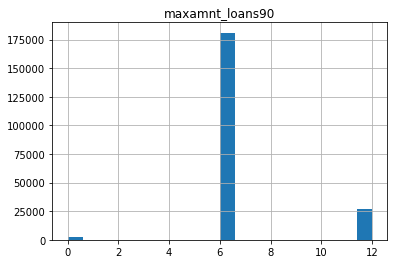

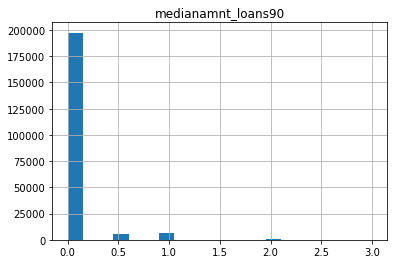

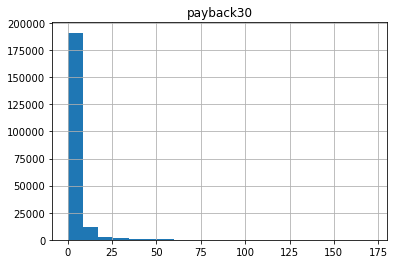

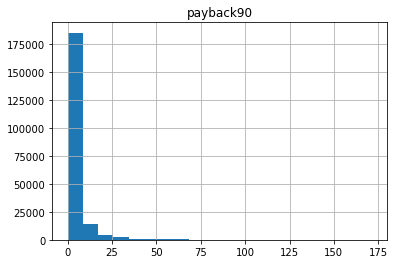

In [23]:
columns=['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90','last_rech_date_ma','last_rech_date_da','last_rech_amt_ma','cnt_ma_rech30','fr_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90','fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90','medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30','cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30','maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90','maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90']

for i in ds[columns]:
    plt.figure()
    plt.title(i)
    ds[i].hist(bins=20)


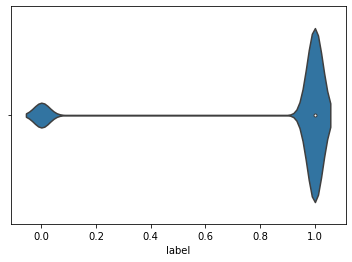

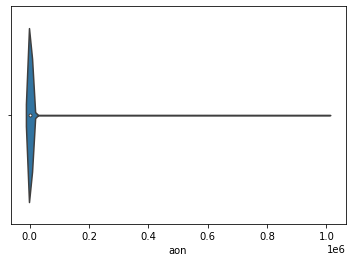

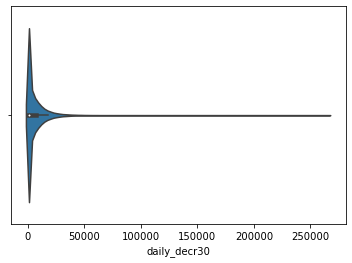

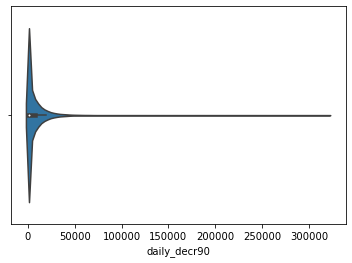

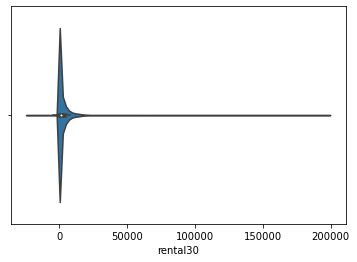

...

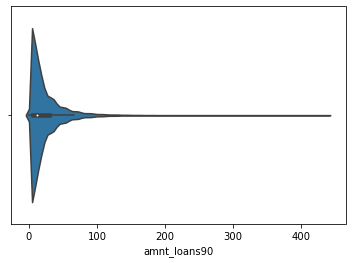

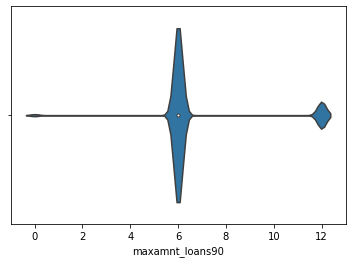

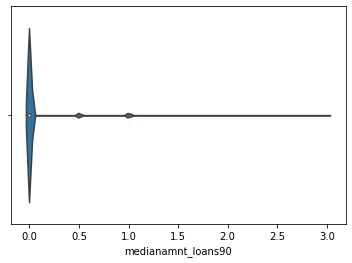

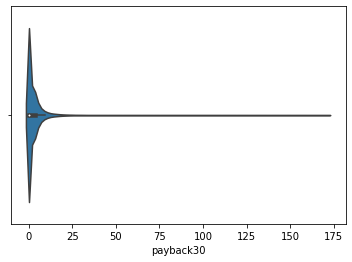

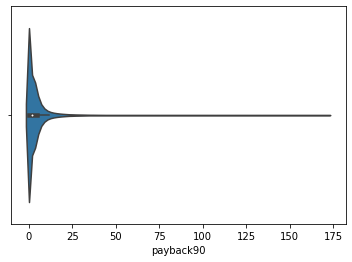

In [24]:
#using the below code creating violinplot.
for i in ds[columns]:
    plt.figure()
    sns.violinplot(ds[i], data=ds)

Observation: by violinplot we can see most of the cloumn values density is on sided

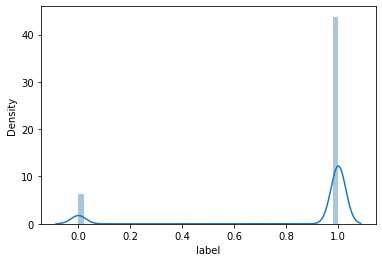

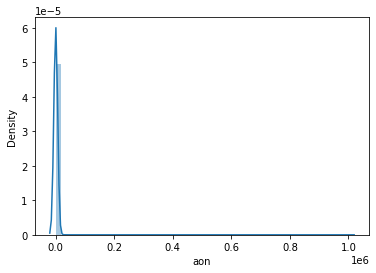

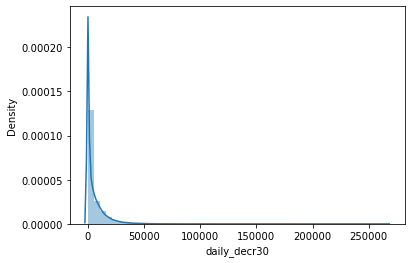

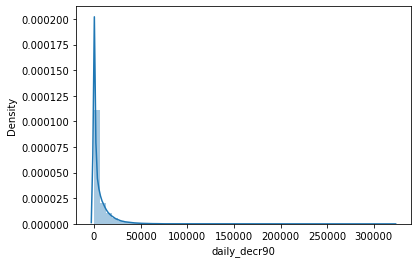

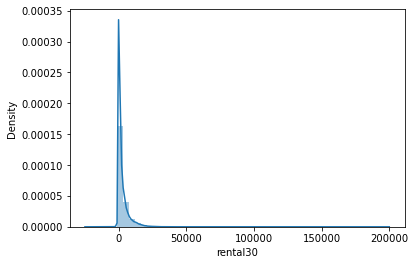

...

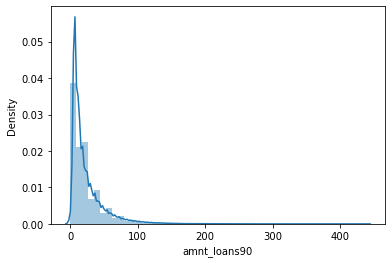

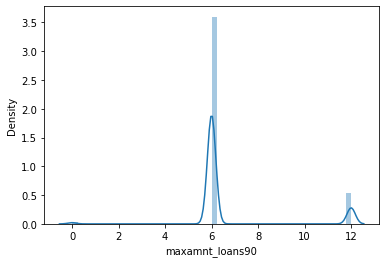

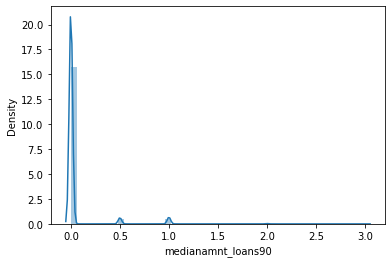

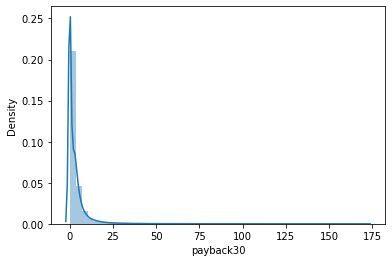

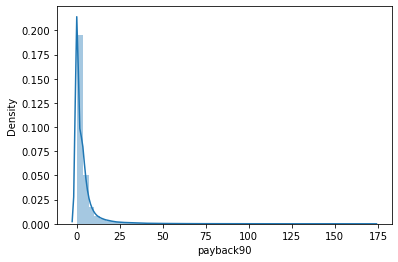

In [25]:
for i in ds[columns]:
    plt.figure()
    sns.distplot(ds[i],kde=True)

Observations: most of the parameters (coulmns) having skewness (+ve skewness)

Bivariate Analysis

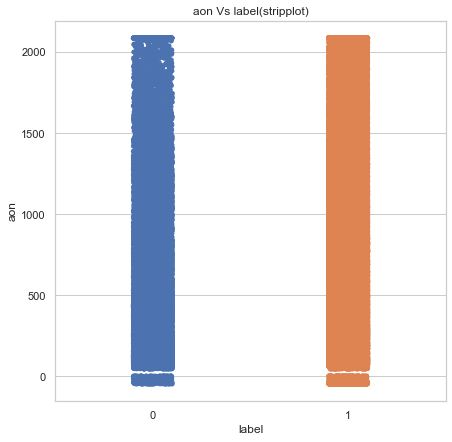

In [85]:
#stripplot between label with their aon
plt.figure(figsize=[7,7])
sns.set(style="whitegrid")
ax=sns.stripplot(x="label",y="aon",data=ds)
plt.title("aon Vs label(stripplot)")
plt.show()

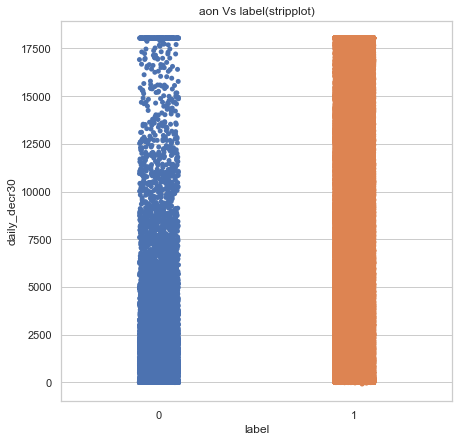

In [87]:
plt.figure(figsize=[7,7])
sns.set(style="whitegrid")
ax=sns.stripplot(x="label",y="daily_decr30",data=ds)
plt.title("daily_decr30 Vs label(stripplot)")
plt.show()

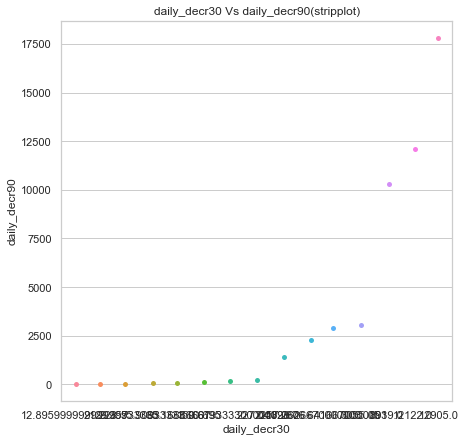

In [89]:

plt.figure(figsize=[7,7])
sns.set(style="whitegrid")
ax=sns.stripplot(x="daily_decr30",y="daily_decr90",data=ds.head(15))
plt.title("daily_decr30 Vs daily_decr90(stripplot)")
plt.show()


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='daily_decr30', ylabel='daily_decr90'>

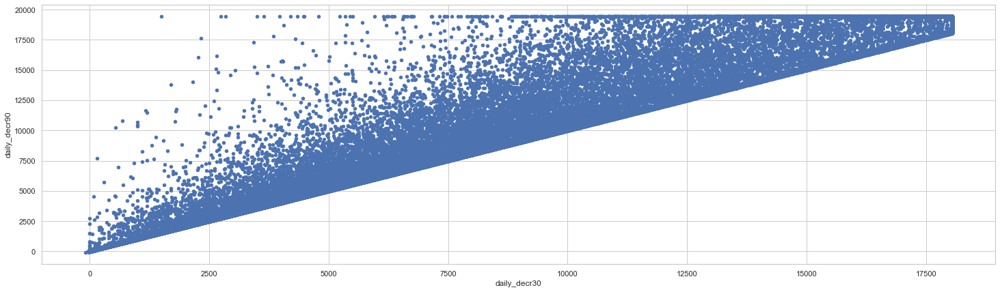

In [97]:
ds.plot.scatter(x="daily_decr30", y="daily_decr90", figsize=(25,7))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='amnt_loans90', ylabel='payback90'>

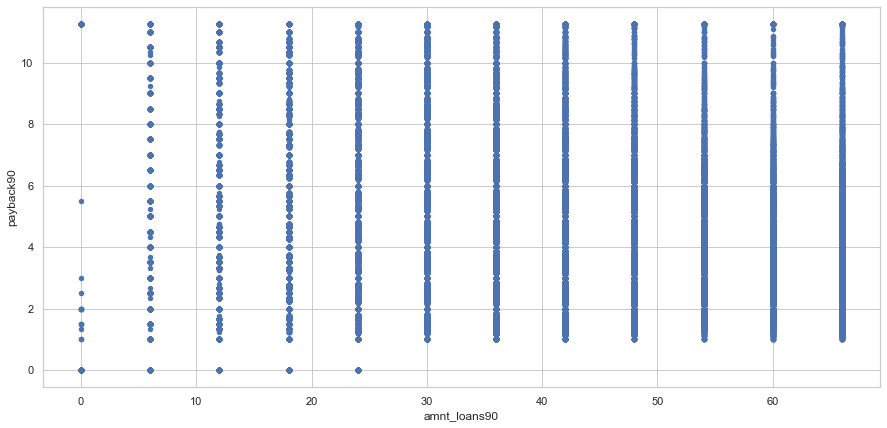

In [104]:
ds.plot.scatter(x="amnt_loans90", y="payback90", figsize=(15,7))

Multivariate Analysis

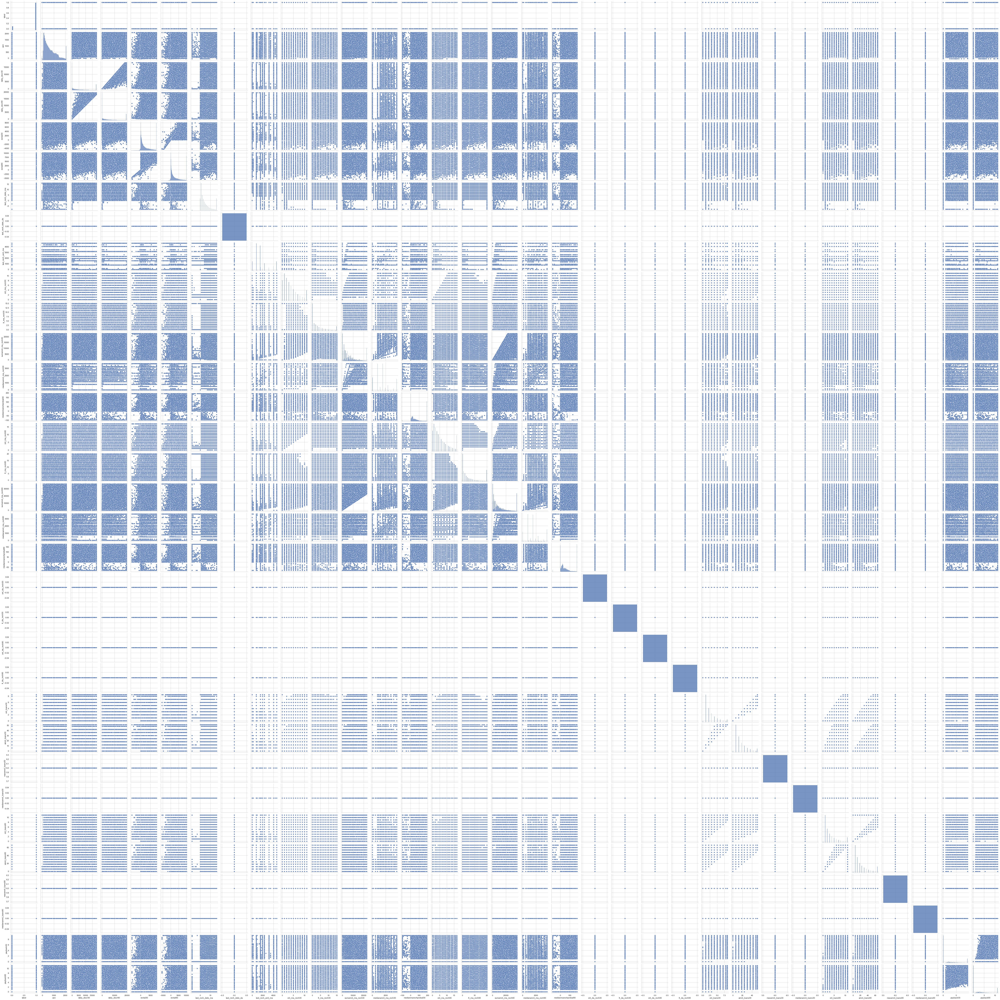

In [105]:
sns.pairplot(ds)

# EDA using Statistical approch 

In [26]:
#checking the correlations between columns
corr=ds.corr()
corr

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,...,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
label,1.000000,-0.003785,0.168298,0.166150,0.058085,0.075521,0.003728,0.001711,0.131804,0.237331,...,0.196283,0.197272,0.000248,0.044589,0.004733,0.199788,0.084144,0.035747,0.048336,0.049183
aon,-0.003785,1.000000,0.001104,0.000374,-0.000960,-0.000790,0.001692,-0.001693,0.004256,-0.003148,...,-0.001826,-0.001726,-0.002764,0.004664,-0.000611,-0.002319,-0.001191,0.002771,0.001940,0.002203
daily_decr30,0.168298,0.001104,1.000000,0.977704,0.442066,0.458977,0.000487,-0.001636,0.275837,0.451385,...,0.366116,0.471492,-0.000028,-0.011610,0.008962,0.563496,0.400199,-0.037305,0.026915,0.047175
daily_decr90,0.166150,0.000374,0.977704,1.000000,0.434685,0.471730,0.000908,-0.001886,0.264131,0.426707,...,0.340387,0.447869,0.000025,-0.005591,0.009446,0.567204,0.397251,-0.034686,0.019400,0.040800
rental30,0.058085,-0.000960,0.442066,0.434685,1.000000,0.955237,-0.001095,0.003261,0.127271,0.233343,...,0.180203,0.233453,-0.000864,-0.016482,0.004012,0.298943,0.234211,-0.035489,0.072974,0.095147
rental90,0.075521,-0.000790,0.458977,0.471730,0.955237,1.000000,-0.001688,0.002794,0.121416,0.230260,...,0.171595,0.231906,-0.001411,-0.009467,0.005141,0.327436,0.251029,-0.034122,0.067110,0.099501
last_rech_date_ma,0.003728,0.001692,0.000487,0.000908,-0.001095,-0.001688,1.000000,0.001790,-0.000147,0.004311,...,0.001193,0.000903,0.000928,0.001835,-0.000225,0.000870,-0.001123,0.002771,-0.002233,-0.001583
last_rech_date_da,0.001711,-0.001693,-0.001636,-0.001886,0.003261,0.002794,0.001790,1.000000,-0.000149,0.001549,...,0.000380,0.000536,0.000503,0.000061,-0.000972,0.000519,0.001524,-0.002239,0.000077,0.000417
last_rech_amt_ma,0.131804,0.004256,0.275837,0.264131,0.127271,0.121416,-0.000147,-0.000149,1.000000,-0.002662,...,-0.027612,0.008502,0.001000,0.028370,0.000093,0.014067,0.148460,0.021004,-0.027369,-0.014260
cnt_ma_rech30,0.237331,-0.003148,0.451385,0.426707,0.233343,0.230260,0.004311,0.001549,-0.002662,1.000000,...,0.765802,0.752296,0.000109,-0.067011,0.014703,0.685257,0.174104,-0.071451,0.043617,0.017362


<AxesSubplot:>

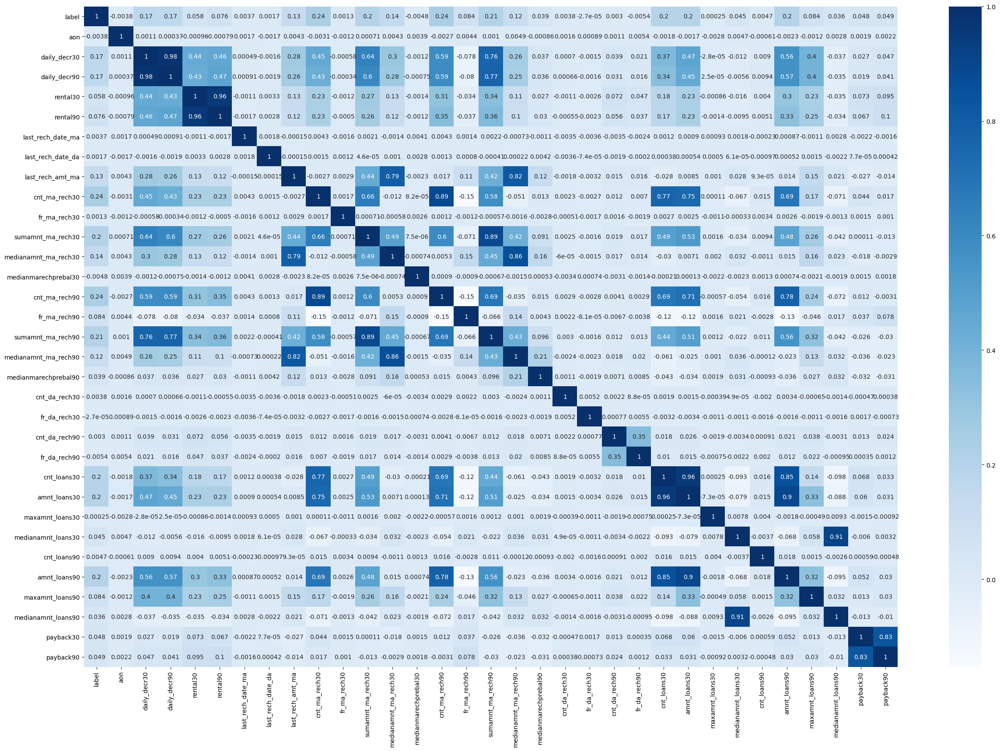

In [27]:
#example of multivariate 
#lets check the correlation matrix
#method ("pearson")

fig=plt.figure(figsize=(30,20),dpi=100)
hc=ds.corr(method="pearson")
sns.heatmap(hc,annot=True,cmap="Blues")

Observation: 
    There is good correlation between daily_decr30 and daily_decr90.
    
    There is not good correlation between label and any of the given parameter.
    
    There is good correlation betweenrental30 and rental90
    
    There is good correlation betweencnt_loans30 and amnt_loans30
    
    There is good correlation betweenpayback30 and payback90
    

In [28]:
corr_matrix=ds.corr()
corr_matrix['label'].sort_values(ascending=False)

label                   1.000000
cnt_ma_rech30           0.237331
cnt_ma_rech90           0.236392
sumamnt_ma_rech90       0.205793
sumamnt_ma_rech30       0.202828
amnt_loans90            0.199788
amnt_loans30            0.197272
cnt_loans30             0.196283
daily_decr30            0.168298
daily_decr90            0.166150
medianamnt_ma_rech30    0.141490
last_rech_amt_ma        0.131804
medianamnt_ma_rech90    0.120855
fr_ma_rech90            0.084385
maxamnt_loans90         0.084144
rental90                0.075521
rental30                0.058085
payback90               0.049183
payback30               0.048336
medianamnt_loans30      0.044589
medianmarechprebal90    0.039300
medianamnt_loans90      0.035747
cnt_loans90             0.004733
cnt_da_rech30           0.003827
last_rech_date_ma       0.003728
cnt_da_rech90           0.002999
last_rech_date_da       0.001711
fr_ma_rech30            0.001330
maxamnt_loans30         0.000248
fr_da_rech30           -0.000027
aon       

There is not good correlation between label and any of the given parameter.

# Data Cleaning and outlier Handling

label                      AxesSubplot(0.125,0.749828;0.0945122x0.130172)
aon                     AxesSubplot(0.238415,0.749828;0.0945122x0.130172)
daily_decr30            AxesSubplot(0.351829,0.749828;0.0945122x0.130172)
daily_decr90            AxesSubplot(0.465244,0.749828;0.0945122x0.130172)
rental30                AxesSubplot(0.578659,0.749828;0.0945122x0.130172)
rental90                AxesSubplot(0.692073,0.749828;0.0945122x0.130172)
last_rech_date_ma       AxesSubplot(0.805488,0.749828;0.0945122x0.130172)
last_rech_date_da          AxesSubplot(0.125,0.593621;0.0945122x0.130172)
last_rech_amt_ma        AxesSubplot(0.238415,0.593621;0.0945122x0.130172)
cnt_ma_rech30           AxesSubplot(0.351829,0.593621;0.0945122x0.130172)
fr_ma_rech30            AxesSubplot(0.465244,0.593621;0.0945122x0.130172)
sumamnt_ma_rech30       AxesSubplot(0.578659,0.593621;0.0945122x0.130172)
medianamnt_ma_rech30    AxesSubplot(0.692073,0.593621;0.0945122x0.130172)
medianmarechprebal30    AxesSubplot(0.

<Figure size 3000x2000 with 0 Axes>

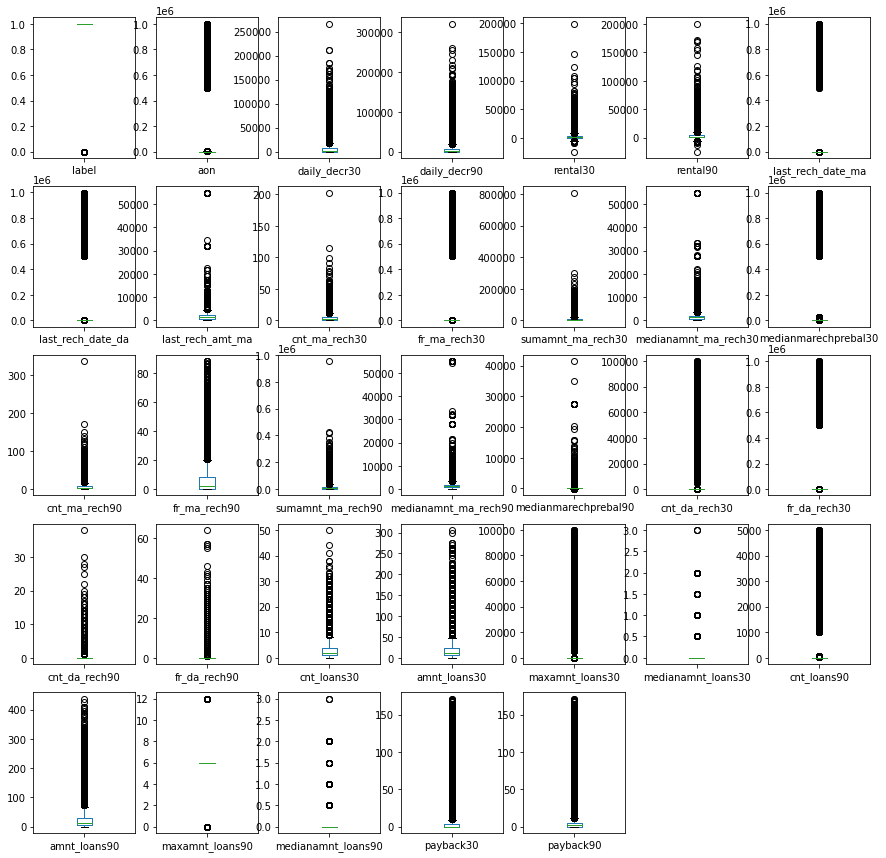

In [29]:
fig=plt.figure(figsize=(30,20),dpi=100)
ds.plot(kind="box",subplots=True,layout=(5,7),figsize=(15,15))

We can see every parameters having outliers

# outliers removal using IQR method

In [30]:
#we checked that thers is outliers, so we can use IQR to remove outliers
def removeOutlier(col):
    sorted(col)
    qua1,qua2 = col.quantile([0.25,0.75])
#IQR calculate 25 to 75% of data
    IQR= qua2 - qua1
    lowerRange = qua1 - (1.5*IQR)
    upperRange= qua2+(1.5*IQR)
    return lowerRange, upperRange

In [31]:
columns1=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90','last_rech_date_ma','last_rech_date_da','last_rech_amt_ma','cnt_ma_rech30','fr_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90','fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90','medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30','cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30','maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90','maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90']
for i in ds[columns1]:
    lowScore, highScore= removeOutlier(ds[i])
    ds[i]=np.where(ds[i]>highScore,highScore,ds[i])
    ds[i]=np.where(ds[i]<lowScore,lowScore,ds[i])

label                      AxesSubplot(0.125,0.749828;0.0945122x0.130172)
aon                     AxesSubplot(0.238415,0.749828;0.0945122x0.130172)
daily_decr30            AxesSubplot(0.351829,0.749828;0.0945122x0.130172)
daily_decr90            AxesSubplot(0.465244,0.749828;0.0945122x0.130172)
rental30                AxesSubplot(0.578659,0.749828;0.0945122x0.130172)
rental90                AxesSubplot(0.692073,0.749828;0.0945122x0.130172)
last_rech_date_ma       AxesSubplot(0.805488,0.749828;0.0945122x0.130172)
last_rech_date_da          AxesSubplot(0.125,0.593621;0.0945122x0.130172)
last_rech_amt_ma        AxesSubplot(0.238415,0.593621;0.0945122x0.130172)
cnt_ma_rech30           AxesSubplot(0.351829,0.593621;0.0945122x0.130172)
fr_ma_rech30            AxesSubplot(0.465244,0.593621;0.0945122x0.130172)
sumamnt_ma_rech30       AxesSubplot(0.578659,0.593621;0.0945122x0.130172)
medianamnt_ma_rech30    AxesSubplot(0.692073,0.593621;0.0945122x0.130172)
medianmarechprebal30    AxesSubplot(0.

<Figure size 3000x2000 with 0 Axes>

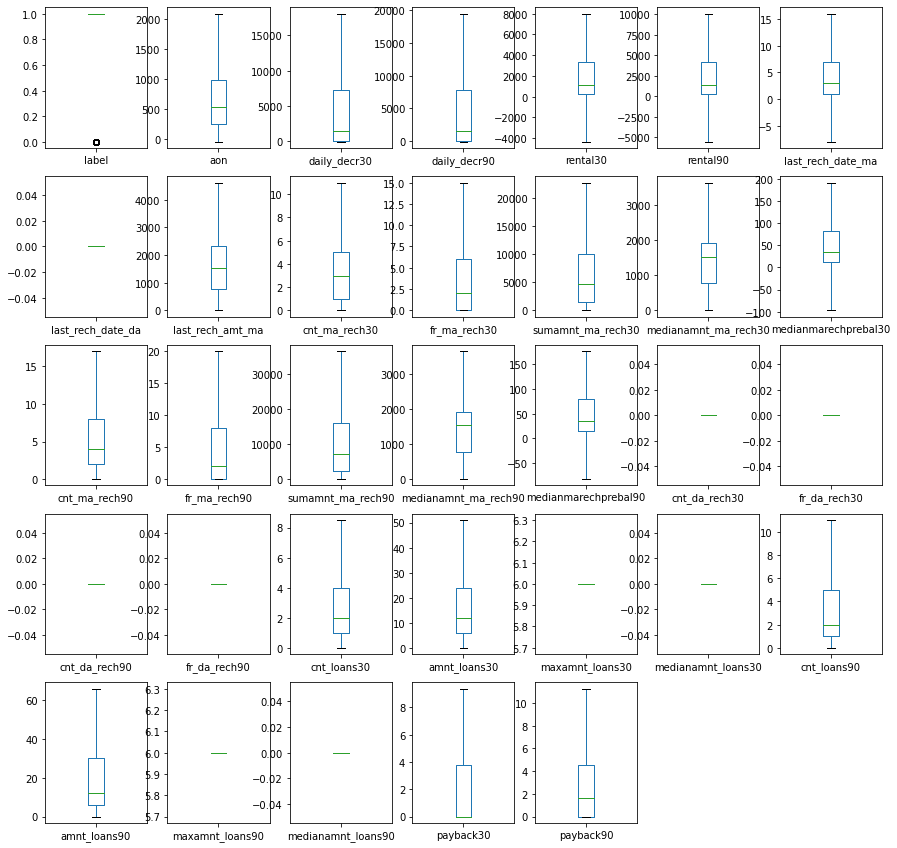

In [32]:
fig=plt.figure(figsize=(30,20),dpi=100)
ds.plot(kind="box",subplots=True,layout=(5,7),figsize=(15,15))

outliers removed from the inputs of dataset

In [33]:
#checking the skewness in dataset
ds.skew()

label                  -2.270254
aon                     0.947127
daily_decr30            1.239231
daily_decr90            1.238995
rental30                1.192510
rental90                1.193291
last_rech_date_ma       1.040301
last_rech_date_da       0.000000
last_rech_amt_ma        1.003446
cnt_ma_rech30           0.904157
fr_ma_rech30            1.253282
sumamnt_ma_rech30       1.080771
medianamnt_ma_rech30    0.728219
medianmarechprebal30    0.988628
cnt_ma_rech90           0.934789
fr_ma_rech90            1.172479
sumamnt_ma_rech90       1.126421
medianamnt_ma_rech90    0.763904
medianmarechprebal90    0.957933
cnt_da_rech30           0.000000
fr_da_rech30            0.000000
cnt_da_rech90           0.000000
fr_da_rech90            0.000000
cnt_loans30             1.340348
amnt_loans30            1.231090
maxamnt_loans30         0.000000
medianamnt_loans30      0.000000
cnt_loans90             1.281861
amnt_loans90            1.217940
maxamnt_loans90         0.000000
medianamnt

observations: most of parameters having positive skewness available


In [34]:
#to resolve the skewness, lets divide the new dataset into input and output datasets
ds_x=ds.drop(columns=["label"])
y=ds[["label"]]

In [35]:
ds_x.shape

(209593, 32)

In [36]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   label   209593 non-null  int64
dtypes: int64(1)
memory usage: 1.6 MB


In [37]:
ds_x.columns

Index(['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90'],
      dtype='object')

In [38]:
ds_x.skew()

aon                     0.947127
daily_decr30            1.239231
daily_decr90            1.238995
rental30                1.192510
rental90                1.193291
last_rech_date_ma       1.040301
last_rech_date_da       0.000000
last_rech_amt_ma        1.003446
cnt_ma_rech30           0.904157
fr_ma_rech30            1.253282
sumamnt_ma_rech30       1.080771
medianamnt_ma_rech30    0.728219
medianmarechprebal30    0.988628
cnt_ma_rech90           0.934789
fr_ma_rech90            1.172479
sumamnt_ma_rech90       1.126421
medianamnt_ma_rech90    0.763904
medianmarechprebal90    0.957933
cnt_da_rech30           0.000000
fr_da_rech30            0.000000
cnt_da_rech90           0.000000
fr_da_rech90            0.000000
cnt_loans30             1.340348
amnt_loans30            1.231090
maxamnt_loans30         0.000000
medianamnt_loans30      0.000000
cnt_loans90             1.281861
amnt_loans90            1.217940
maxamnt_loans90         0.000000
medianamnt_loans90      0.000000
payback30 

In [39]:
#tried to remove outlier (sqrt then cbrt) but didnt get good result so now resolve skewness using power transform.

ds_new=power_transform(ds_x)
ds_new=pd.DataFrame(ds_new,columns=ds_x.columns)

In [40]:
ds_new.skew()

aon                     0.303288
daily_decr30           -5.145303
daily_decr90           -5.361849
rental30                0.133157
rental90                0.083529
last_rech_date_ma      -0.125348
last_rech_date_da       0.000000
last_rech_amt_ma       -0.336663
cnt_ma_rech30          -0.033368
fr_ma_rech30            0.118452
sumamnt_ma_rech30      -0.452785
medianamnt_ma_rech30   -0.555924
medianmarechprebal30    0.054210
cnt_ma_rech90          -0.040754
fr_ma_rech90            0.091461
sumamnt_ma_rech90      -0.356097
medianamnt_ma_rech90   -0.430848
medianmarechprebal90    0.179317
cnt_da_rech30           0.000000
fr_da_rech30            0.000000
cnt_da_rech90           0.000000
fr_da_rech90            0.000000
cnt_loans30             0.044046
amnt_loans30            0.005370
maxamnt_loans30         0.000000
medianamnt_loans30      0.000000
cnt_loans90             0.092294
amnt_loans90           -0.000218
maxamnt_loans90         0.000000
medianamnt_loans90      0.000000
payback30 

Observations: Still daily_decr30, daily_decr90, medianamnt_ma_rech30 having skewness..(values are greater or smaller than 0.5)

In [41]:
#to resolve skewness in Still daily_decr30, daily_decr90, medianamnt_ma_rech30---> used cbrt
columns2=["daily_decr30","daily_decr90","medianamnt_ma_rech30"]

for i in columns2:
    ds_new[i]=np.cbrt(ds_new[i])


In [42]:
ds_new.skew()

aon                     0.303288
daily_decr30           -0.001162
daily_decr90            0.010770
rental30                0.133157
rental90                0.083529
last_rech_date_ma      -0.125348
last_rech_date_da       0.000000
last_rech_amt_ma       -0.336663
cnt_ma_rech30          -0.033368
fr_ma_rech30            0.118452
sumamnt_ma_rech30      -0.452785
medianamnt_ma_rech30   -0.221937
medianmarechprebal30    0.054210
cnt_ma_rech90          -0.040754
fr_ma_rech90            0.091461
sumamnt_ma_rech90      -0.356097
medianamnt_ma_rech90   -0.430848
medianmarechprebal90    0.179317
cnt_da_rech30           0.000000
fr_da_rech30            0.000000
cnt_da_rech90           0.000000
fr_da_rech90            0.000000
cnt_loans30             0.044046
amnt_loans30            0.005370
maxamnt_loans30         0.000000
medianamnt_loans30      0.000000
cnt_loans90             0.092294
amnt_loans90           -0.000218
maxamnt_loans90         0.000000
medianamnt_loans90      0.000000
payback30 

Observations: skewness resolved

In [43]:
x=ds_new

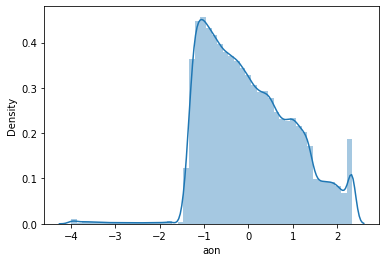

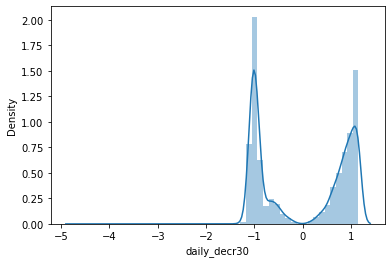

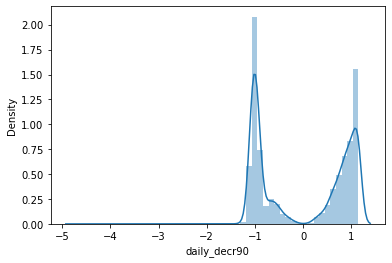

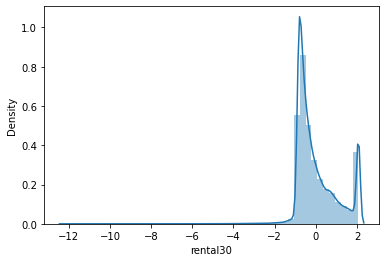

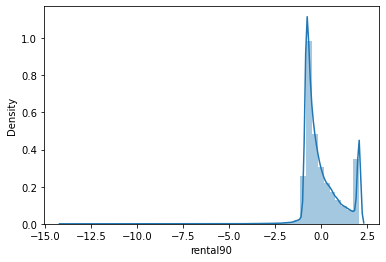

...

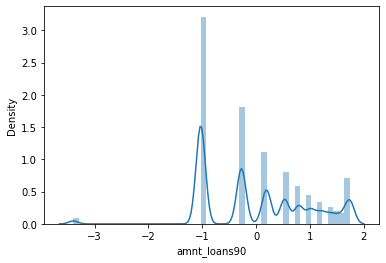

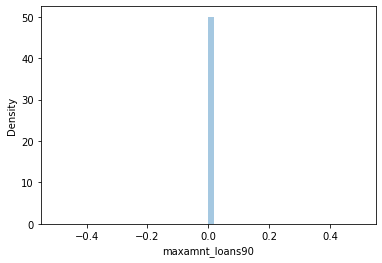

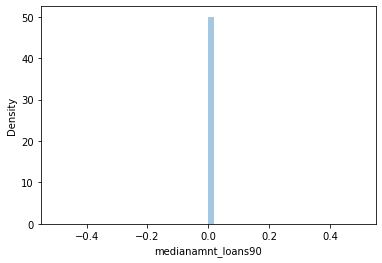

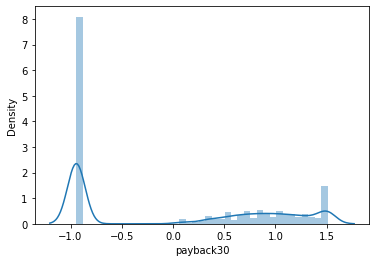

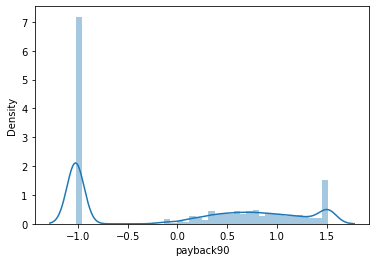

In [44]:
columns1=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90','last_rech_date_ma','last_rech_date_da','last_rech_amt_ma','cnt_ma_rech30','fr_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90','fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90','medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30','cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30','maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90','maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90']
for i in x[columns1]:
    plt.figure()
    sns.distplot(x[i],kde=True)

Observation: as per the distplot of current dataset--> no skewness in parameters

# Feature Engineering

In [45]:
#checking lable parameter (as output) frequency using countplot again

<AxesSubplot:xlabel='label', ylabel='count'>

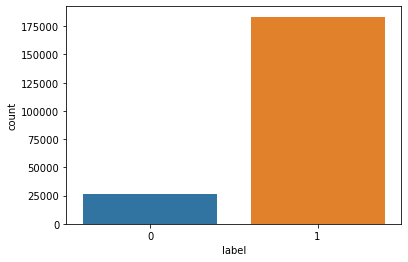

In [46]:
sns.countplot(x=ds["label"])

Observations: There is label imbalance in between defaulter and non defaulter.. (very lass defaulter as compair to non defaulter).. 
so to get better model we have to balance it by over sampling in minority class or under sampling in majority class 

because there is minority class (0--> defaulter) is very less so we can use oversampling the minority class

Handling class imbalance problem by oversampling the minority class :-

In [47]:
#before oversampling we bring all feature to a common scale using standard scaler

sc=StandardScaler()
x=sc.fit_transform(x)

In [48]:
x=pd.DataFrame(x)
x

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-0.735565,0.764458,0.748503,-0.740999,-0.737747,-0.477820,0.0,0.119205,-0.316955,1.567144,...,0.001617,-0.114109,0.0,0.0,-0.212495,-0.273326,0.0,0.0,1.510284,1.518911
1,0.219699,1.140445,1.126570,0.633961,0.360344,1.931827,0.0,1.664764,-0.836948,-1.125983,...,-0.921755,-0.114109,0.0,0.0,-1.044198,-0.273326,0.0,0.0,-0.943595,-1.025751
2,-0.130534,0.166225,-0.264899,-0.430601,-0.501211,-0.249233,0.0,0.119205,-0.836948,-1.125983,...,-0.921755,-0.923232,0.0,0.0,-1.044198,-1.029695,0.0,0.0,-0.943595,-1.025751
3,-0.817761,-1.089639,-1.085390,-0.772499,-0.780028,1.931827,0.0,-0.349345,-1.655740,-1.125983,...,0.001617,-0.114109,0.0,0.0,-0.212495,-0.273326,0.0,0.0,-0.943595,-1.025751
4,0.642736,-0.950764,-0.948645,-0.347145,-0.433414,-0.037768,0.0,0.600459,1.079957,0.156274,...,1.643691,1.596097,0.0,0.0,1.260879,1.193769,0.0,0.0,0.654560,0.428191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,-0.415261,-0.949890,-0.947790,-0.351175,-0.436686,-0.731677,0.0,1.435408,0.071666,0.156274,...,0.001617,-0.114109,0.0,0.0,-0.212495,-0.273326,0.0,0.0,0.087480,-0.126901
209589,0.858276,-1.060796,-1.056854,-0.094032,-0.228146,-0.037768,0.0,-0.515964,0.384881,-0.278502,...,0.561036,0.406807,0.0,0.0,0.290364,0.191303,0.0,0.0,0.087480,-0.126901
209590,0.755003,1.135098,1.122370,1.381339,1.756660,-0.249233,0.0,0.119205,0.648703,1.143998,...,0.947362,1.596097,0.0,0.0,1.097140,1.496525,0.0,0.0,1.015053,0.782938
209591,1.854412,1.147256,1.134873,-0.647617,-0.472187,-0.477820,0.0,-0.515964,0.648703,0.647655,...,0.001617,0.406807,0.0,0.0,0.290364,0.527762,0.0,0.0,-0.943595,1.474998


Observation: all parameters are now in same range (or common scale)

In [49]:
#installed the imbalance library for over samping

#!pip install imbalanced-learn

In [50]:
from imblearn.over_sampling import SMOTE
SM = SMOTE ()

x_over,y_over=SM.fit_resample(x,y)

In [51]:
y_over

,label
0,0
1,1
2,1
3,1
4,1
...,...
366857,0
366858,0
366859,0
366860,0


In [52]:
x_over

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-0.735565,0.764458,0.748503,-0.740999,-0.737747,-0.477820,0.0,0.119205,-0.316955,1.567144,...,0.001617,-0.114109,0.0,0.0,-0.212495,-0.273326,0.0,0.0,1.510284,1.518911
1,0.219699,1.140445,1.126570,0.633961,0.360344,1.931827,0.0,1.664764,-0.836948,-1.125983,...,-0.921755,-0.114109,0.0,0.0,-1.044198,-0.273326,0.0,0.0,-0.943595,-1.025751
2,-0.130534,0.166225,-0.264899,-0.430601,-0.501211,-0.249233,0.0,0.119205,-0.836948,-1.125983,...,-0.921755,-0.923232,0.0,0.0,-1.044198,-1.029695,0.0,0.0,-0.943595,-1.025751
3,-0.817761,-1.089639,-1.085390,-0.772499,-0.780028,1.931827,0.0,-0.349345,-1.655740,-1.125983,...,0.001617,-0.114109,0.0,0.0,-0.212495,-0.273326,0.0,0.0,-0.943595,-1.025751
4,0.642736,-0.950764,-0.948645,-0.347145,-0.433414,-0.037768,0.0,0.600459,1.079957,0.156274,...,1.643691,1.596097,0.0,0.0,1.260879,1.193769,0.0,0.0,0.654560,0.428191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366857,0.168319,-1.183559,-1.178179,2.073845,2.050504,-1.030232,0.0,-2.125906,-1.655740,-1.125983,...,-0.921755,-0.923232,0.0,0.0,-1.044198,-1.029695,0.0,0.0,-0.943595,-1.025751
366858,-1.276699,-1.135429,-1.128211,0.822213,0.598982,0.778765,0.0,-0.516428,-0.836948,-1.125983,...,-0.921755,-0.923232,0.0,0.0,-1.044198,-1.029695,0.0,0.0,-0.943595,-1.025751
366859,-0.990144,0.948099,0.934366,-0.455971,-0.508083,-0.731677,0.0,-0.519004,1.405294,-0.053716,...,1.517936,1.440733,0.0,0.0,1.260879,1.193769,0.0,0.0,1.010075,0.863057
366860,1.059796,0.715207,0.697330,2.073845,2.050504,1.694360,0.0,0.475772,-0.836948,-1.125983,...,0.001617,-0.114109,0.0,0.0,-0.212495,-0.273326,0.0,0.0,-0.943595,-1.025751


Observation: after oversampling number of rows increased-- 366862

# Model Building (Train test split)

In [53]:
x=x_over
y=y_over

In [54]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.22,random_state=45)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(286152, 32)
(80710, 32)
(286152, 1)
(80710, 1)


observations: test size in 22% and random state is 45.
    
    286152 rows as train case
    80710 rows as test case 

# Build and Evaluate the models

In [55]:
#using Logistic Regression--> there are only 2 values of y. so we can not use learn Rigression here...

lg=LogisticRegression()
lg.fit(x_train,y_train)
pred=lg.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.7757031346797175
[[31923  8511]
 [ 9592 30684]]
              precision    recall  f1-score   support

           0       0.77      0.79      0.78     40434
           1       0.78      0.76      0.77     40276

    accuracy                           0.78     80710
   macro avg       0.78      0.78      0.78     80710
weighted avg       0.78      0.78      0.78     80710



In [56]:
#using GaussianNB
gnb=GaussianNB()
gnb.fit(x_train,y_train)
predg=gnb.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,predg))
print(confusion_matrix(y_test,predg))
print(classification_report(y_test,predg))

accuracy score:
0.7568702762978565
[[31391  9043]
 [10580 29696]]
              precision    recall  f1-score   support

           0       0.75      0.78      0.76     40434
           1       0.77      0.74      0.75     40276

    accuracy                           0.76     80710
   macro avg       0.76      0.76      0.76     80710
weighted avg       0.76      0.76      0.76     80710



In [58]:
#Using Linear SVC
from sklearn.svm import LinearSVC
clf = LinearSVC(random_state=0, tol=1e-5)
clf.fit(x_train, y_train.values.ravel())
pred=clf.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.7751951431049436
[[31842  8592]
 [ 9552 30724]]
              precision    recall  f1-score   support

           0       0.77      0.79      0.78     40434
           1       0.78      0.76      0.77     40276

    accuracy                           0.78     80710
   macro avg       0.78      0.78      0.78     80710
weighted avg       0.78      0.78      0.78     80710



In [60]:
#using decision tree classifier
dtc=DecisionTreeClassifier()  #---> criterion-->gini as default
dtc.fit(x_train,y_train)
dtc.score(x_train,y_train)
preddtc=dtc.predict(x_test)
print(accuracy_score(y_test,preddtc))
print(confusion_matrix(y_test,preddtc))
print(classification_report(y_test,preddtc))

0.8905959608474786
[[36420  4014]
 [ 4816 35460]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89     40434
           1       0.90      0.88      0.89     40276

    accuracy                           0.89     80710
   macro avg       0.89      0.89      0.89     80710
weighted avg       0.89      0.89      0.89     80710



In [61]:
#using Kneighors classifier
#k=5
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)
pred=knn.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.8812538718870029
[[39860   574]
 [ 9010 31266]]
              precision    recall  f1-score   support

           0       0.82      0.99      0.89     40434
           1       0.98      0.78      0.87     40276

    accuracy                           0.88     80710
   macro avg       0.90      0.88      0.88     80710
weighted avg       0.90      0.88      0.88     80710



In [62]:
#Ensemble Techniques ----Classifier

In [63]:
#using random forest classifier
rf=RandomForestClassifier(n_estimators=100)
rf.fit(x_train,y_train)
pred=rf.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.9409490769421385
[[38067  2367]
 [ 2399 37877]]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94     40434
           1       0.94      0.94      0.94     40276

    accuracy                           0.94     80710
   macro avg       0.94      0.94      0.94     80710
weighted avg       0.94      0.94      0.94     80710



In [64]:
#using Ada boost classifier 
ad=AdaBoostClassifier(n_estimators=100)
ad.fit(x_train,y_train)
pred=ad.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.8430058233180523
[[34791  5643]
 [ 7028 33248]]
              precision    recall  f1-score   support

           0       0.83      0.86      0.85     40434
           1       0.85      0.83      0.84     40276

    accuracy                           0.84     80710
   macro avg       0.84      0.84      0.84     80710
weighted avg       0.84      0.84      0.84     80710



In [65]:
gbc=GradientBoostingClassifier(n_estimators=100)
gbc.fit(x_train,y_train)
pred=gbc.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.8690868541692479
[[36099  4335]
 [ 6231 34045]]
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     40434
           1       0.89      0.85      0.87     40276

    accuracy                           0.87     80710
   macro avg       0.87      0.87      0.87     80710
weighted avg       0.87      0.87      0.87     80710



Observation: we can see randomforest providing highest accuracy 

# Hyper Parameter tunning

In [66]:
#GridSearchCV for Decision tree classifier

grid_param = { "criterion": ["gini","entropy"]}

gd_sr =GridSearchCV(estimator= dtc, param_grid=grid_param,scoring="accuracy", cv=5) #defaut scoring ="accuracy"
gd_sr.fit(x_train,y_train)

best_parameters = gd_sr.best_params_
print(best_parameters)
best_result = gd_sr.best_score_
print(best_result)

{'criterion': 'entropy'}
0.8901667569613814


# Evaluate the model again

In [67]:
dtc=DecisionTreeClassifier(criterion = 'entropy')
dtc.fit(x_train,y_train)
dtc.score(x_train,y_train)
preddtc=dtc.predict(x_test)
print(accuracy_score(y_test,preddtc))
print(confusion_matrix(y_test,preddtc))
print(classification_report(y_test,preddtc))

0.8970635608970388
[[36645  3789]
 [ 4519 35757]]
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     40434
           1       0.90      0.89      0.90     40276

    accuracy                           0.90     80710
   macro avg       0.90      0.90      0.90     80710
weighted avg       0.90      0.90      0.90     80710



observation: accuracy inproved from 0.8901994796183869 to 0.8968033700904473

In [68]:
#using n_estimator= 200 
rf=RandomForestClassifier(n_estimators=200)
rf.fit(x_train,y_train)
pred=rf.predict(x_test)
print("accuracy score:",)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:
0.9418783298228225
[[38063  2371]
 [ 2320 37956]]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94     40434
           1       0.94      0.94      0.94     40276

    accuracy                           0.94     80710
   macro avg       0.94      0.94      0.94     80710
weighted avg       0.94      0.94      0.94     80710



observation: Accuracy score inproved from 0.9409490769421385 to 0.9418783298228225

#Cross validation

cross validation is taking too long time to run

score=cross_val_score(rf, x, y, cv=10)

print(score)

print(score.mean())

# AUC_ROC Curve

In [69]:
y_pred_prob=lg.predict_proba(x_test)[:,1]

In [70]:
y_pred_prob

array([0.53661463, 0.85903606, 0.7885001 , ..., 0.9095665 , 0.17602655,
       0.97523719])

In [71]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [72]:
fpr  # false positive ration

array([0.        , 0.        , 0.        , ..., 0.99982688, 1.        ,
       1.        ])

In [73]:
tpr #true positive ration

array([0.00000000e+00, 2.48286821e-05, 1.42268348e-02, ...,
       9.99975171e-01, 9.99975171e-01, 1.00000000e+00])

In [74]:
thresholds

array([1.99988383, 0.99988383, 0.9850232 , ..., 0.0267432 , 0.01492268,
       0.00278351])

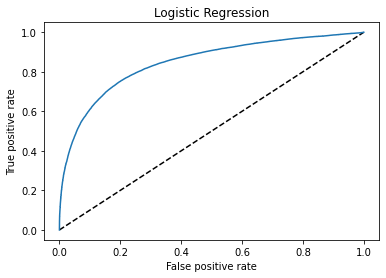

In [75]:
#curve for Logistic Regression
plt.plot([0,1],[0,1],"k--")
plt.plot(fpr,tpr,label="Logistic Regression")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("Logistic Regression")
plt.show()

more than 75% area under the curve

In [76]:
auc_score=roc_auc_score(y_test,lg.predict(x_test))

In [77]:
print(auc_score)

0.7756760552808857


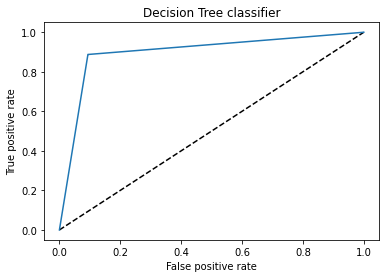

0.8970454601489816

In [78]:
#Decision Tree Curve
y_pred_prob=dtc.predict_proba(x_test)[:,1]
fpr,tpr,threshold=roc_curve(y_test,y_pred_prob)
plt.plot([0,1],[0,1],"k--")
plt.plot(fpr,tpr,label="Decision Tree Classifier")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("Decision Tree classifier")
plt.show()
auc_score=roc_auc_score(y_test,dtc.predict(x_test))
auc_score

approx 90% area under the curve

# Saving Model

we are saving model here from rf because "RandomForestClassifier" given the best accuracy score of dataset

In [80]:
joblib.dump(rf,"Micro_Credit_Loan_RFFILE.obj")

rf_from_joblib=joblib.load("Micro_Credit_Loan_RFFILE.obj")